# Industrial Defect Inspection & Surface Crack Detection via Custom Linear Filtering and Edge Processing


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Imports

In [2]:
import numpy as np
import cv2
import os
import math
import random
import matplotlib.pyplot as plt
from collections import deque

## Data Loading

In [3]:
random.seed(42)
np.random.seed(42)

In [4]:
BASE_DIR = '/content/drive/MyDrive/CV_Assignment1'
SURFACE_CRACK_DIR = os.path.join(BASE_DIR, 'Surface_Crack')
PCB_DIR = os.path.join(BASE_DIR, 'PCB_DATASET')
POSITIVE_DIR = f'{BASE_DIR}/Surface_Crack/Positive'
NEGATIVE_DIR = f'{BASE_DIR}/Surface_Crack/Negative'
PCB_IMAGES_DIR = f'{BASE_DIR}/PCB_DATASET/images'

IMAGE_EXTENSIONS = ('.jpg', '.jpeg', '.png', '.bmp')

def count_images(folder):
    return len([f for f in os.listdir(folder) if f.lower().endswith(IMAGE_EXTENSIONS)])

print('Positive images :', count_images(POSITIVE_DIR))
print('Negative images :', count_images(NEGATIVE_DIR))
print('PCB images      :', count_images(PCB_IMAGES_DIR))

Positive images : 75
Negative images : 75
PCB images      : 60


In [5]:
def get_image_paths(folder, recursive=False):
    image_paths = []
    if recursive:
        for root, _, files in os.walk(folder):
            for file in files:
                if file.lower().endswith(IMAGE_EXTENSIONS):
                    image_paths.append(os.path.join(root, file))
    else:
        for file in os.listdir(folder):
            if file.lower().endswith(IMAGE_EXTENSIONS):
                image_paths.append(os.path.join(folder, file))
    return image_paths

pcb_image_paths_all = get_image_paths(PCB_IMAGES_DIR, recursive=True)
positive_image_paths = get_image_paths(POSITIVE_DIR)
negative_image_paths = get_image_paths(NEGATIVE_DIR)

print('PCB image paths     :', len(pcb_image_paths_all))
print('Positive image paths:', len(positive_image_paths))
print('Negative image paths:', len(negative_image_paths))

PCB image paths     : 60
Positive image paths: 75
Negative image paths: 75


## Helper Functions

In [6]:
def load_image_grayscale(path):
    bgr_image = cv2.imread(path)
    gray_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2GRAY)
    return gray_image

def load_image_color(path):
    bgr_image = cv2.imread(path)
    rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)
    return rgb_image

def show_image(image, title='Image', cmap='gray'):
    plt.figure(figsize=(5, 5))
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.show()

def show_image_grid(images, titles, cols=3, cmap='gray'):
    rows = math.ceil(len(images) / cols)
    plt.figure(figsize=(5 * cols, 5 * rows))
    for idx in range(len(images)):
        plt.subplot(rows, cols, idx + 1)
        plt.imshow(images[idx], cmap=cmap)
        plt.title(titles[idx])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def normalize_uint8(image):
    image = image.astype(np.float64)
    image = image - image.min()
    if image.max() > 0:
        image = image / image.max()
    return (image * 255).astype(np.uint8)

# Task 1: Generalized 2D and 3D Convolution Engines

### 2D Spatial Convolution
output dimensions formula
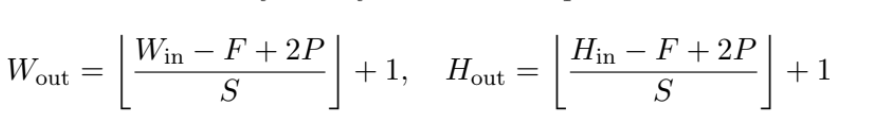

In [7]:
def conv2d(image, kernel, stride=1, padding='same', pad_value=0):
    image = image.astype(np.float64)
    kernel = kernel.astype(np.float64)

    H, W = image.shape
    F_h, F_w = kernel.shape

    if padding.lower() == 'same':
        pad_h = (F_h - 1) // 2
        pad_w = (F_w - 1) // 2
    elif padding.lower() == 'valid':
        pad_h = 0
        pad_w = 0
    else:
        raise ValueError("padding must be 'same' or 'valid'")

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant', constant_values=pad_value)

    out_h = (padded.shape[0] - F_h) // stride + 1
    out_w = (padded.shape[1] - F_w) // stride + 1
    output = np.zeros((out_h, out_w), dtype=np.float64)

    for i in range(out_h):
        for j in range(out_w):
            r0 = i * stride
            c0 = j * stride
            region = padded[r0:r0 + F_h, c0:c0 + F_w]
            output[i, j] = np.sum(region * kernel)

    return output

**Test setup:** a simple 3x3 averaging kernel and sample images from both datasets.

In [8]:
test_kernel = np.ones((3, 3), dtype=np.float64) / 9.0

pcb_test_paths = pcb_image_paths_all[:5]
positive_test_paths = positive_image_paths[:5]
negative_test_paths = negative_image_paths[:5]
surface_test_paths = positive_test_paths + negative_test_paths
surface_test_labels = ['Positive'] * len(positive_test_paths) + ['Negative'] * len(negative_test_paths)

**Test conv2d on PCB images**

PCB image 1 | Input: (2464, 3056) | Output: (2464, 3056)
PCB image 2 | Input: (2530, 2529) | Output: (2530, 2529)
PCB image 3 | Input: (2464, 3056) | Output: (2464, 3056)
PCB image 4 | Input: (2464, 3056) | Output: (2464, 3056)
PCB image 5 | Input: (2464, 3056) | Output: (2464, 3056)


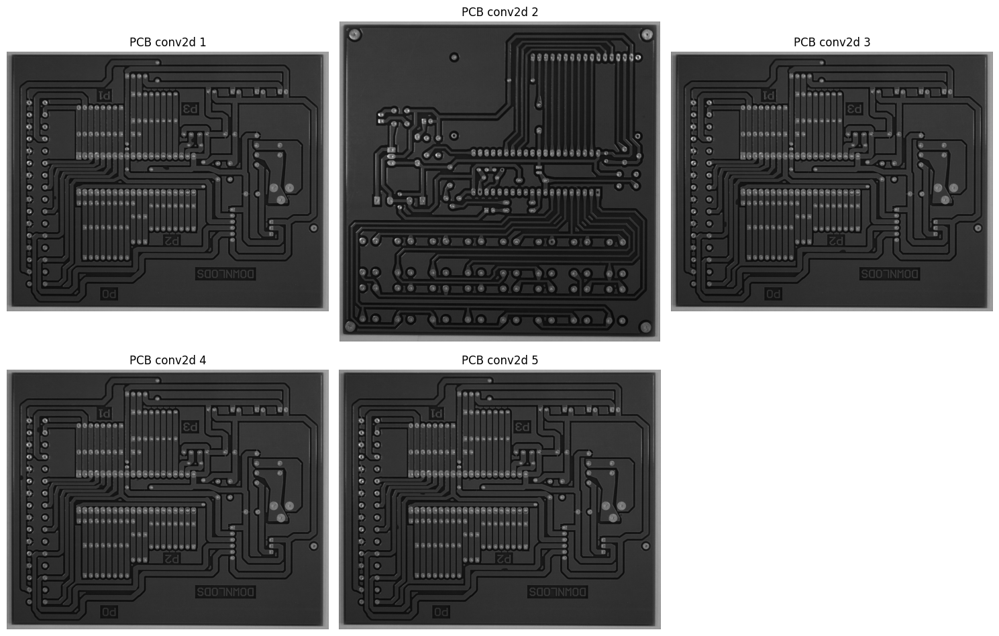

In [9]:
pcb_conv2d_outputs = []

for i, path in enumerate(pcb_test_paths):
    image = load_image_grayscale(path)
    output = conv2d(image, test_kernel, stride=1, padding='same')
    pcb_conv2d_outputs.append(output)
    print('PCB image', i + 1, '| Input:', image.shape, '| Output:', output.shape)

show_image_grid(pcb_conv2d_outputs, [f'PCB conv2d {i+1}' for i in range(len(pcb_conv2d_outputs))])

**Test conv2d on Surface Crack images**

Positive image 1 | Input: (227, 227) | Output: (227, 227)
Positive image 2 | Input: (227, 227) | Output: (227, 227)
Positive image 3 | Input: (227, 227) | Output: (227, 227)
Positive image 4 | Input: (227, 227) | Output: (227, 227)
Positive image 5 | Input: (227, 227) | Output: (227, 227)
Negative image 6 | Input: (227, 227) | Output: (227, 227)
Negative image 7 | Input: (227, 227) | Output: (227, 227)
Negative image 8 | Input: (227, 227) | Output: (227, 227)
Negative image 9 | Input: (227, 227) | Output: (227, 227)
Negative image 10 | Input: (227, 227) | Output: (227, 227)


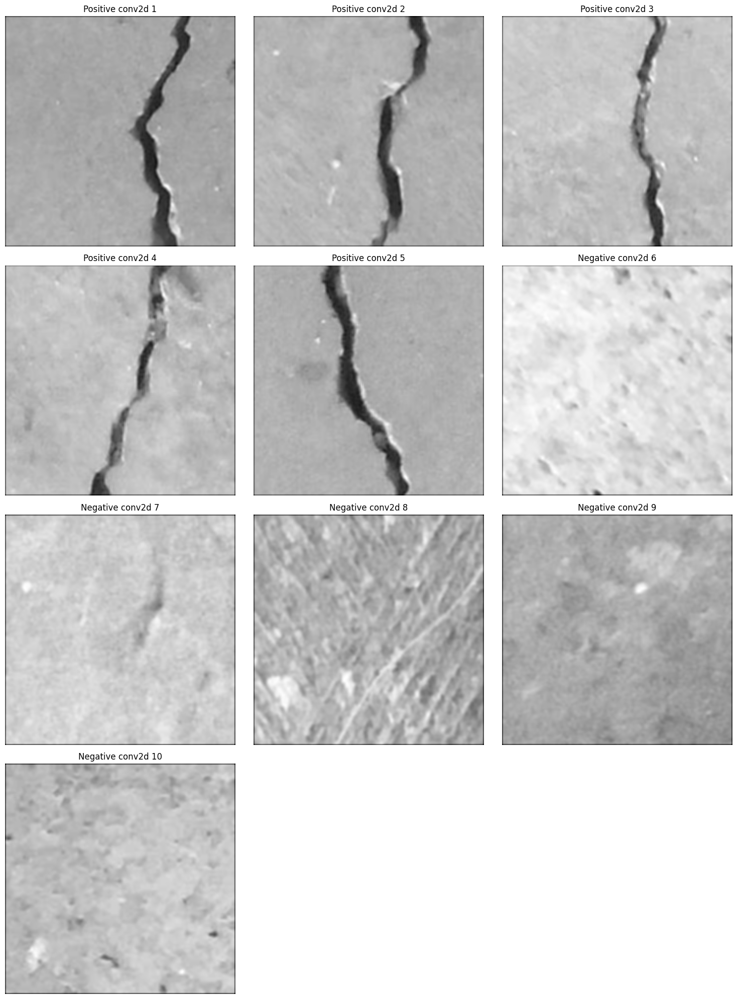

In [10]:
surface_conv2d_outputs = []

for i, path in enumerate(surface_test_paths):
    image = load_image_grayscale(path)
    output = conv2d(image, test_kernel, stride=1, padding='same')
    surface_conv2d_outputs.append(output)
    print(surface_test_labels[i], 'image', i + 1, '| Input:', image.shape, '| Output:', output.shape)

titles = [f'{surface_test_labels[i]} conv2d {i+1}' for i in range(len(surface_test_paths))]
show_image_grid(surface_conv2d_outputs, titles)

**Check same vs valid padding, and stride**

In [11]:
sample_gray = load_image_grayscale(surface_test_paths[0])

same_out = conv2d(sample_gray, test_kernel, stride=1, padding='same')
valid_out = conv2d(sample_gray, test_kernel, stride=1, padding='valid')
stride2_out = conv2d(sample_gray, test_kernel, stride=2, padding='same')

print('Input shape :', sample_gray.shape)
print('Same output :', same_out.shape)
print('Valid output:', valid_out.shape, '(expected', (sample_gray.shape[0]-2, sample_gray.shape[1]-2), ')')
print('Stride 2    :', stride2_out.shape)

Input shape : (227, 227)
Same output : (227, 227)
Valid output: (225, 225) (expected (225, 225) )
Stride 2    : (114, 114)


### 3D Multi-Channel Convolution
Image shape (H, W, C), kernel stack shape (K, kh, kw, C). Each output channel k is a channel-wise product summed over C, stacked into (Hout, Wout, K).

In [12]:
def conv3d(image, kernel_stack, stride=1, padding='same'):
    image = image.astype(np.float64)
    kernel_stack = kernel_stack.astype(np.float64)

    H, W, C = image.shape
    K, F_h, F_w, F_c = kernel_stack.shape
    if F_c != C:
        raise ValueError('Kernel channel count must match image channel count')

    if padding.lower() == 'same':
        pad_h = (F_h - 1) // 2
        pad_w = (F_w - 1) // 2
    elif padding.lower() == 'valid':
        pad_h = 0
        pad_w = 0
    else:
        raise ValueError("padding must be 'same' or 'valid'")

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w), (0, 0)), mode='constant', constant_values=0)

    out_h = (padded.shape[0] - F_h) // stride + 1
    out_w = (padded.shape[1] - F_w) // stride + 1
    output = np.zeros((out_h, out_w, K), dtype=np.float64)

    for k in range(K):
        kernel = kernel_stack[k]
        for i in range(out_h):
            for j in range(out_w):
                r0 = i * stride
                c0 = j * stride
                patch = padded[r0:r0 + F_h, c0:c0 + F_w, :]
                output[i, j, k] = np.sum(patch * kernel)

    return output

**Test setup:** 3 kernels : RGB average, red-channel-only average, green-channel-only average.

In [13]:
kernel_1 = np.ones((3, 3, 3), dtype=np.float64) / 27.0

kernel_2 = np.zeros((3, 3, 3), dtype=np.float64)
kernel_2[:, :, 0] = 1.0 / 9.0

kernel_3 = np.zeros((3, 3, 3), dtype=np.float64)
kernel_3[:, :, 1] = 1.0 / 9.0

kernel_stack = np.stack([kernel_1, kernel_2, kernel_3], axis=0)
print('Kernel stack shape:', kernel_stack.shape)

Kernel stack shape: (3, 3, 3, 3)


**Test conv3d on PCB and Surface Crack images**

PCB image 1 | Input: (2464, 3056, 3) | Output: (2464, 3056, 3)
PCB image 2 | Input: (2530, 2529, 3) | Output: (2530, 2529, 3)
PCB image 3 | Input: (2464, 3056, 3) | Output: (2464, 3056, 3)
PCB image 4 | Input: (2464, 3056, 3) | Output: (2464, 3056, 3)
PCB image 5 | Input: (2464, 3056, 3) | Output: (2464, 3056, 3)


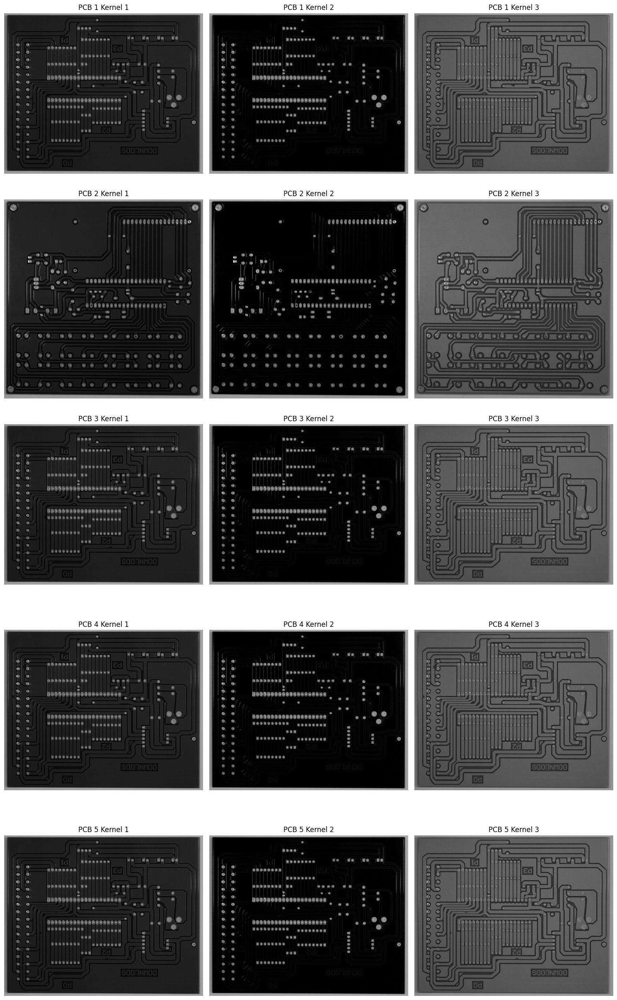

In [14]:
pcb_conv3d_outputs = []
for i, path in enumerate(pcb_test_paths):
    image = load_image_color(path)
    output = conv3d(image, kernel_stack, stride=1, padding='same')
    pcb_conv3d_outputs.append(output)
    print('PCB image', i + 1, '| Input:', image.shape, '| Output:', output.shape)

activation_images, activation_titles = [], []
for i, output in enumerate(pcb_conv3d_outputs):
    for k in range(output.shape[2]):
        activation_images.append(output[:, :, k])
        activation_titles.append(f'PCB {i+1} Kernel {k+1}')

show_image_grid(activation_images, activation_titles)

Positive image 1 | Input: (227, 227, 3) | Output: (227, 227, 3)
Positive image 2 | Input: (227, 227, 3) | Output: (227, 227, 3)
Positive image 3 | Input: (227, 227, 3) | Output: (227, 227, 3)
Positive image 4 | Input: (227, 227, 3) | Output: (227, 227, 3)
Positive image 5 | Input: (227, 227, 3) | Output: (227, 227, 3)
Negative image 6 | Input: (227, 227, 3) | Output: (227, 227, 3)
Negative image 7 | Input: (227, 227, 3) | Output: (227, 227, 3)
Negative image 8 | Input: (227, 227, 3) | Output: (227, 227, 3)
Negative image 9 | Input: (227, 227, 3) | Output: (227, 227, 3)
Negative image 10 | Input: (227, 227, 3) | Output: (227, 227, 3)


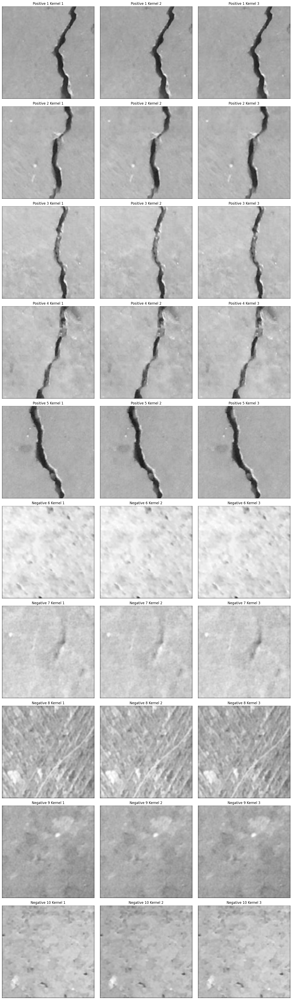

In [15]:
surface_conv3d_outputs = []
for i, path in enumerate(surface_test_paths):
    image = load_image_color(path)
    output = conv3d(image, kernel_stack, stride=1, padding='same')
    surface_conv3d_outputs.append(output)
    print(surface_test_labels[i], 'image', i + 1, '| Input:', image.shape, '| Output:', output.shape)

activation_images, activation_titles = [], []
for i, output in enumerate(surface_conv3d_outputs):
    for k in range(output.shape[2]):
        activation_images.append(output[:, :, k])
        activation_titles.append(f'{surface_test_labels[i]} {i+1} Kernel {k+1}')

show_image_grid(activation_images, activation_titles)

In [16]:
print('TASK 1 VERIFICATION')
print('conv2d PCB samples    :', len(pcb_test_paths))
print('conv2d Surface samples:', len(surface_test_paths))
print('conv3d PCB samples    :', len(pcb_test_paths))
print('conv3d Surface samples:', len(surface_test_paths))
print('Kernel stack shape    :', kernel_stack.shape)
print('same/valid padding, stride tested: Yes')

TASK 1 VERIFICATION
conv2d PCB samples    : 5
conv2d Surface samples: 10
conv3d PCB samples    : 5
conv3d Surface samples: 10
Kernel stack shape    : (3, 3, 3, 3)
same/valid padding, stride tested: Yes


# Task 2: Filtering, Contrast Sharpening & Subsampling

### Isotropic 2D Gaussian Kernel
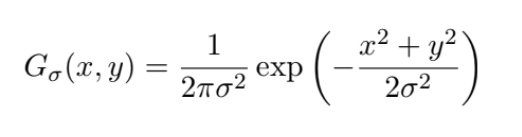

In [17]:
def generate_gaussian_kernel_2d(ksize, sigma):
    half = ksize // 2
    x, y = np.meshgrid(np.arange(-half, half + 1), np.arange(-half, half + 1))
    kernel = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    kernel = kernel / (2 * np.pi * sigma**2)
    kernel = kernel / np.sum(kernel)
    return kernel

Kernel sum: 1.0
[[0.01214612 0.02610994 0.03369732 0.02610994 0.01214612]
 [0.02610994 0.0561273  0.07243752 0.0561273  0.02610994]
 [0.03369732 0.07243752 0.09348738 0.07243752 0.03369732]
 [0.02610994 0.0561273  0.07243752 0.0561273  0.02610994]
 [0.01214612 0.02610994 0.03369732 0.02610994 0.01214612]]


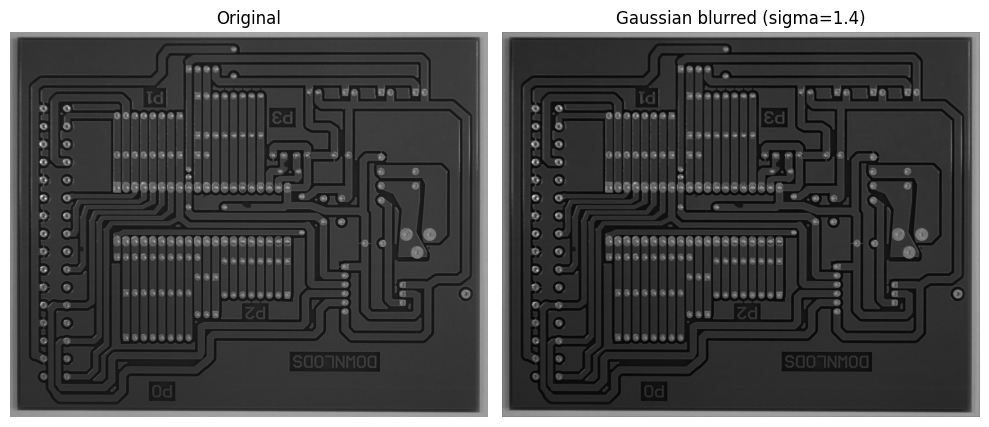

In [18]:
g_kernel = generate_gaussian_kernel_2d(5, sigma=1.4)
print('Kernel sum:', np.sum(g_kernel))
print(g_kernel)

sample_gray = load_image_grayscale(pcb_test_paths[0])
blurred = conv2d(sample_gray, g_kernel, stride=1, padding='same')
show_image_grid([sample_gray, blurred], ['Original', 'Gaussian blurred (sigma=1.4)'], cols=2)

### Unsharp Masking
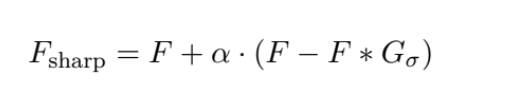

In [19]:
def unsharp_mask(image, sigma=1.5, alpha=1.2):
    image = image.astype(np.float64)
    ksize = int(2 * math.ceil(3 * sigma) + 1)
    kernel = generate_gaussian_kernel_2d(ksize, sigma)
    blurred = conv2d(image, kernel, stride=1, padding='same')
    detail = image - blurred
    sharp = image + alpha * detail
    sharp = np.clip(sharp, 0, 255)
    return sharp.astype(np.uint8)

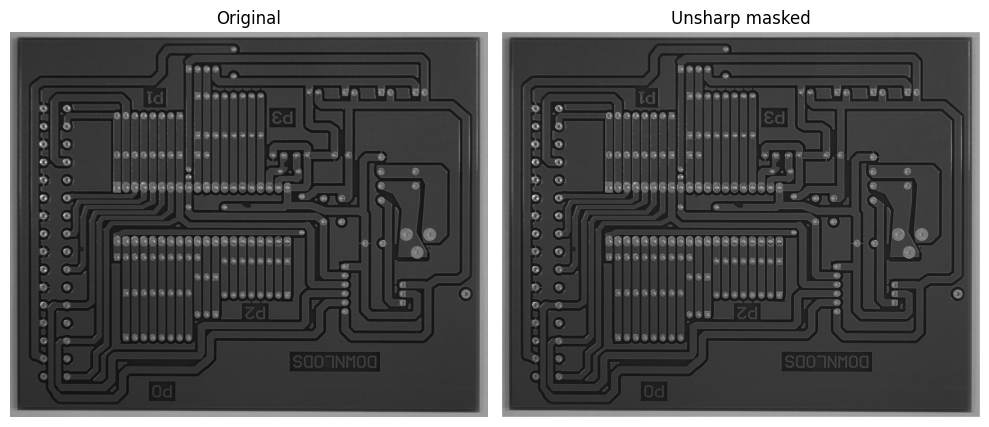

In [20]:
sharp = unsharp_mask(sample_gray, sigma=1.5, alpha=1.2)
show_image_grid([sample_gray, sharp], ['Original', 'Unsharp masked'], cols=2)

### Feature Subsampling via 2D Pooling

In [21]:
def pool2d(feature_map, pool_size=(2, 2), stride=2, mode='max'):
    H, W = feature_map.shape
    p_h, p_w = pool_size
    out_h = (H - p_h) // stride + 1
    out_w = (W - p_w) // stride + 1
    output = np.zeros((out_h, out_w), dtype=np.float64)

    for i in range(out_h):
        for j in range(out_w):
            r0 = i * stride
            c0 = j * stride
            region = feature_map[r0:r0 + p_h, c0:c0 + p_w]
            if mode == 'max':
                output[i, j] = np.max(region)
            elif mode == 'average':
                output[i, j] = np.mean(region)
            else:
                raise ValueError("mode must be 'max' or 'average'")
    return output

Input shape : (2464, 3056)
Max pooled  : (1232, 1528)
Avg pooled  : (1232, 1528)


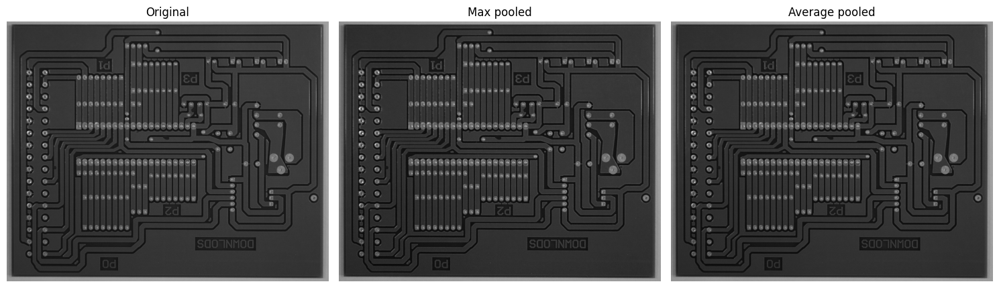

In [22]:
max_pooled = pool2d(sample_gray.astype(np.float64), pool_size=(2, 2), stride=2, mode='max')
avg_pooled = pool2d(sample_gray.astype(np.float64), pool_size=(2, 2), stride=2, mode='average')

print('Input shape :', sample_gray.shape)
print('Max pooled  :', max_pooled.shape)
print('Avg pooled  :', avg_pooled.shape)

show_image_grid([sample_gray, max_pooled, avg_pooled], ['Original', 'Max pooled', 'Average pooled'], cols=3)

**Theoretical Reflection (for report):**
For input block
$$\begin{bmatrix} 8 & 7 \\ 12 & 9 \end{bmatrix}$$
the max is 12, so the gradient matrix is
$$\frac{\partial \text{Output}}{\partial \text{Input}} = \begin{bmatrix} 0 & 0 \\ 1 & 0 \end{bmatrix}$$
Max pooling is a selection operation — only the maximum element affects the output, so during backpropagation the incoming gradient routes entirely to that element's position; every other position has zero local influence on the output and therefore receives zero gradient.

# Task 3: First-Principles Canny Edge Detection Pipeline

### Stage 1: Sobel Gradient Computation
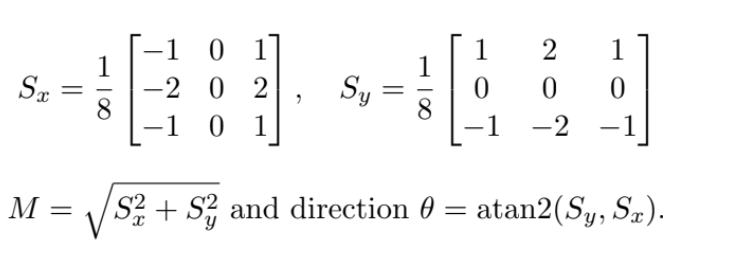

In [23]:
def sobel_gradients(image):
    Sx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float64) / 8.0
    Sy = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], dtype=np.float64) / 8.0

    Gx = conv2d(image, Sx, stride=1, padding='same')
    Gy = conv2d(image, Sy, stride=1, padding='same')

    magnitude = np.sqrt(Gx**2 + Gy**2)
    direction = np.arctan2(Gy, Gx)
    return magnitude, direction

### Stage 2: Non-Maximum Suppression
Angle quantized into 4 sectors (0, 45, 90, 135 degrees), each compared against its two directional neighbours.

In [24]:
def non_max_suppression(magnitude, direction):
    H, W = magnitude.shape
    angle = np.degrees(direction)
    angle[angle < 0] += 180

    output = np.zeros((H, W), dtype=np.float64)

    for i in range(1, H - 1):
        for j in range(1, W - 1):
            a = angle[i, j]
            m = magnitude[i, j]

            if a < 22.5 or a >= 157.5:
                n1, n2 = magnitude[i, j - 1], magnitude[i, j + 1]
            elif a < 67.5:
                n1, n2 = magnitude[i - 1, j + 1], magnitude[i + 1, j - 1]
            elif a < 112.5:
                n1, n2 = magnitude[i - 1, j], magnitude[i + 1, j]
            else:
                n1, n2 = magnitude[i - 1, j - 1], magnitude[i + 1, j + 1]

            if m > n1 and m > n2:
                output[i, j] = m

    return output

### Stage 3: Double Thresholding & 8-Connected Hysteresis

In [25]:
def hysteresis_tracking(img_nms, low_thresh, high_thresh):
    H, W = img_nms.shape
    strong_i, strong_j = np.where(img_nms >= high_thresh)

    output = np.zeros((H, W), dtype=np.uint8)
    output[strong_i, strong_j] = 255

    queue = deque(zip(strong_i, strong_j))
    while queue:
        ci, cj = queue.popleft()
        for ni in range(max(0, ci - 1), min(H, ci + 2)):
            for nj in range(max(0, cj - 1), min(W, cj + 2)):
                if img_nms[ni, nj] >= low_thresh and output[ni, nj] == 0:
                    output[ni, nj] = 255
                    queue.append((ni, nj))
    return output

In [42]:
def otsu_threshold(values, n_bins=256):
    """
    Otsu's method: finds the threshold that best separates a 1D distribution
    into two classes (background vs. edge) by maximizing between-class
    variance. Unlike a fixed percentile, this adapts to the actual shape of
    the histogram -- it works whether the image has sparse edges or dense
    edges, and isn't thrown off by a handful of outlier pixels.
    """
    values = values[values > 0]  # ignore flat/zero background
    if values.size == 0:
        return 0.0

    hist, bin_edges = np.histogram(values, bins=n_bins)
    hist = hist.astype(np.float64)
    total = hist.sum()
    if total == 0:
        return 0.0

    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2.0
    sum_total = np.sum(hist * bin_centers)

    wB, sumB = 0.0, 0.0
    max_var, best_thresh = 0.0, bin_centers[0]

    for i in range(n_bins):
        wB += hist[i]
        if wB == 0:
            continue
        wF = total - wB
        if wF == 0:
            break
        sumB += hist[i] * bin_centers[i]
        mB = sumB / wB
        mF = (sum_total - sumB) / wF
        between_var = wB * wF * (mB - mF) ** 2
        if between_var > max_var:
            max_var = between_var
            best_thresh = bin_centers[i]

    return best_thresh


def compute_adaptive_thresholds(magnitude, low_ratio=0.5):
    """
    Thigh = Otsu threshold on the gradient magnitude (robustly separates
    edge pixels from background). Tlow = low_ratio * Thigh, following the
    standard Canny convention (typically 0.4-0.5x the high threshold).
    """
    t_high = otsu_threshold(magnitude)
    t_low = low_ratio * t_high
    return t_low, t_high

### Full Pipeline

In [43]:
def canny_edge_detection(image, sigma=1.4, ksize=5, low_thresh=None, high_thresh=None,low_ratio=0.5):
    image = image.astype(np.float64)
    gauss_kernel = generate_gaussian_kernel_2d(ksize, sigma)
    smoothed = conv2d(image, gauss_kernel, stride=1, padding='same')

    magnitude, direction = sobel_gradients(smoothed)
    nms = non_max_suppression(magnitude, direction)

    if low_thresh is None or high_thresh is None:
        low_thresh, high_thresh = compute_adaptive_thresholds(nms, low_ratio)

        if np.sum(nms >= high_thresh) == 0:
            candidates = nms[nms > 0]
            if candidates.size > 0:
                high_thresh = np.percentile(candidates, 90)
                low_thresh = 0.5 * high_thresh
                print('  [fallback] Otsu found no strong pixels, used p90 instead '
                      f'-> Tlow={low_thresh:.2f}, Thigh={high_thresh:.2f}')

    edges = hysteresis_tracking(nms, low_thresh, high_thresh)

    return edges, magnitude, nms, smoothed, low_thresh, high_thresh

**Test on PCB and Surface Crack samples**

PCB: Otsu thresholds Tlow=2.99, Thigh=5.99


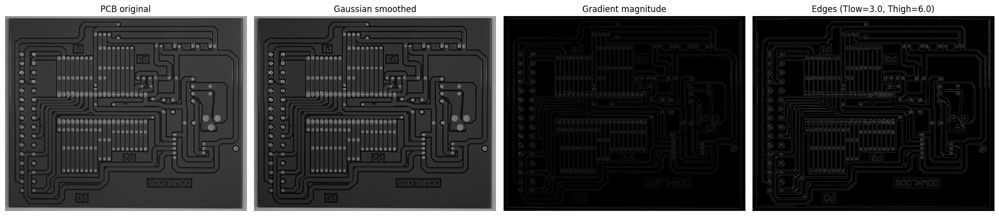

Surface Crack (Positive): Otsu thresholds Tlow=4.80, Thigh=9.60


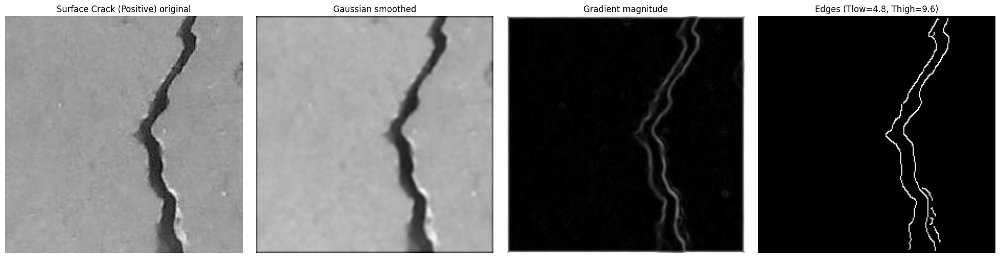

In [44]:
canny_test_images = [
    load_image_grayscale(pcb_test_paths[0]),
    load_image_grayscale(surface_test_paths[0]),   # Positive
]
canny_test_titles = ['PCB', 'Surface Crack (Positive)']

for image, title in zip(canny_test_images, canny_test_titles):
    edges, magnitude, nms, smoothed, t_low, t_high = canny_edge_detection(image, sigma=1.4)
    print(f'{title}: Otsu thresholds Tlow={t_low:.2f}, Thigh={t_high:.2f}')
    show_image_grid(
        [image, smoothed, normalize_uint8(magnitude), edges],
        [f'{title} original', 'Gaussian smoothed', 'Gradient magnitude', f'Edges (Tlow={t_low:.1f}, Thigh={t_high:.1f})'],
        cols=4
    )

# Task 4: Step-by-Step Visual Ablation Study

### Ablation 1: Impact of Noise & Smoothing

--- PCB ---


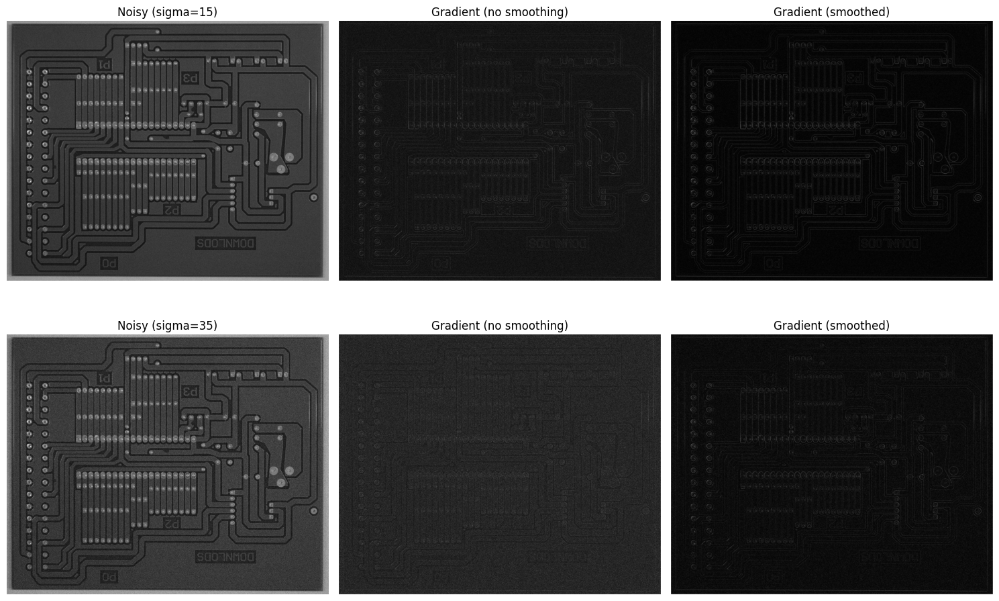

--- Surface Crack ---


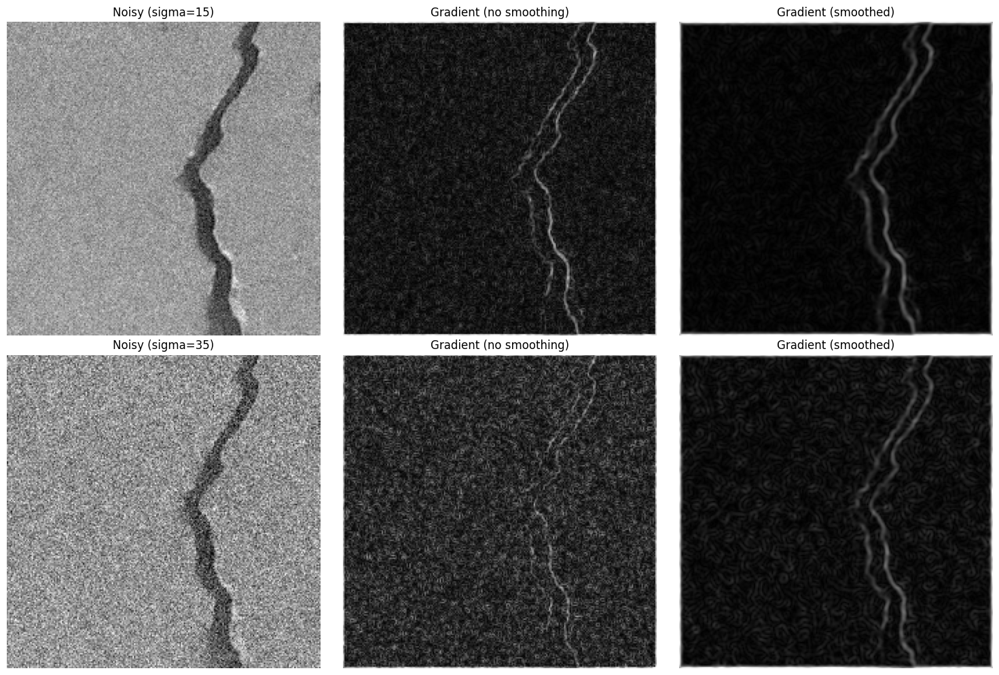

In [45]:
gauss_kernel = generate_gaussian_kernel_2d(5, sigma=1.4)

ablation_targets = [
    ('PCB', load_image_grayscale(pcb_test_paths[0]).astype(np.float64)),
    ('Surface Crack', load_image_grayscale(surface_test_paths[0]).astype(np.float64)),
]

for name, ablation_image in ablation_targets:
    noise_images, noise_titles = [], []
    for sigma_n in [15, 35]:
        noise = np.random.normal(0, sigma_n, ablation_image.shape)
        noisy = np.clip(ablation_image + noise, 0, 255)

        mag_no_smooth, _ = sobel_gradients(noisy)
        smoothed = conv2d(noisy, gauss_kernel, stride=1, padding='same')
        mag_smooth, _ = sobel_gradients(smoothed)

        noise_images += [noisy, normalize_uint8(mag_no_smooth), normalize_uint8(mag_smooth)]
        noise_titles += [f'Noisy (sigma={sigma_n})', 'Gradient (no smoothing)', 'Gradient (smoothed)']

    print(f'--- {name} ---')
    show_image_grid(noise_images, noise_titles, cols=3)

### Ablation 2: Impact of Non-Maximum Suppression

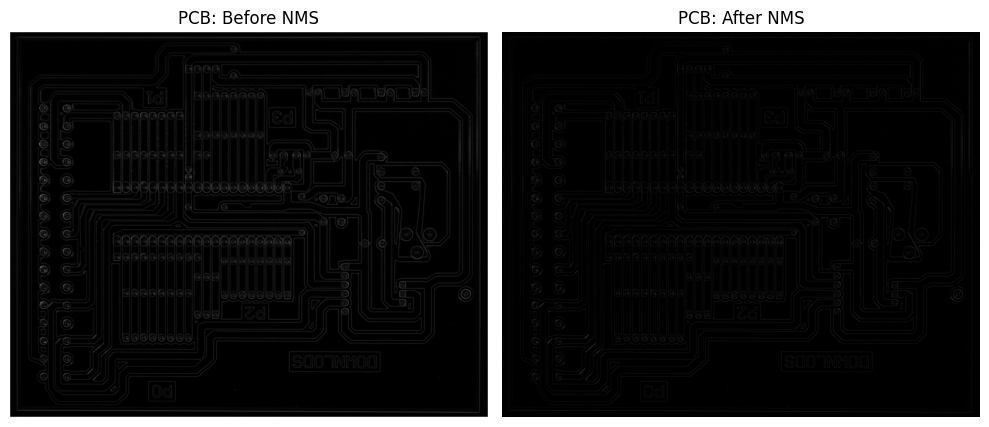

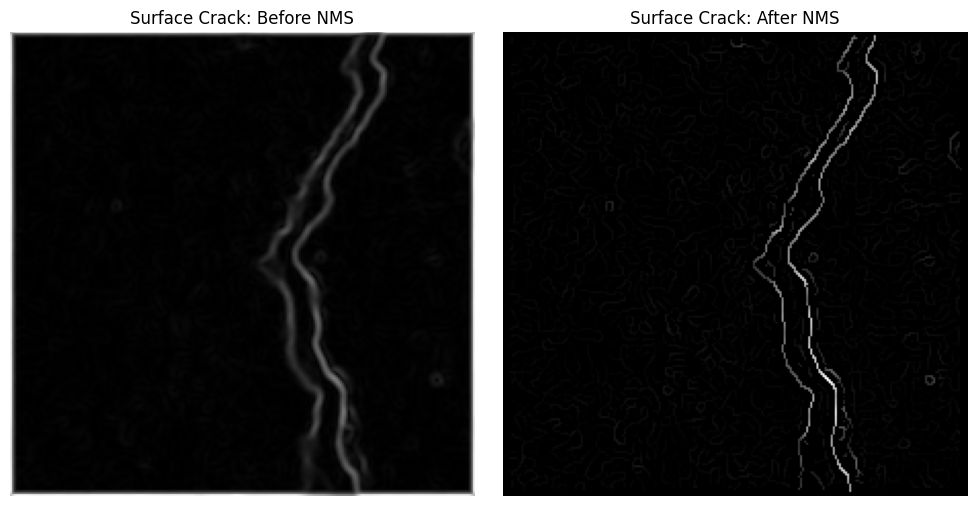

In [46]:
nms_results = {}

for name, img_path in [('PCB', pcb_test_paths[0]), ('Surface Crack', surface_test_paths[0])]:
    gray = load_image_grayscale(img_path).astype(np.float64)
    smoothed = conv2d(gray, gauss_kernel, stride=1, padding='same')
    magnitude, direction = sobel_gradients(smoothed)
    nms = non_max_suppression(magnitude, direction)
    nms_results[name] = nms

    show_image_grid(
        [normalize_uint8(magnitude), normalize_uint8(nms)],
        [f'{name}: Before NMS', f'{name}: After NMS'],
        cols=2
    )

### Ablation 3: Hysteresis vs Single Global Threshold

PCB: Otsu Tlow=2.99, Thigh=5.99
  Edge pixels - single threshold: 233247
  Edge pixels - hysteresis      : 260188


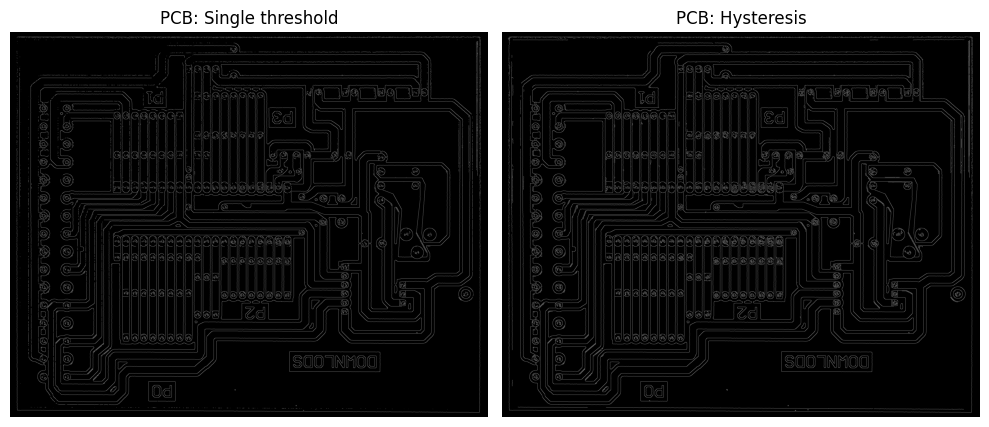

Surface Crack: Otsu Tlow=4.80, Thigh=9.60
  Edge pixels - single threshold: 575
  Edge pixels - hysteresis      : 665


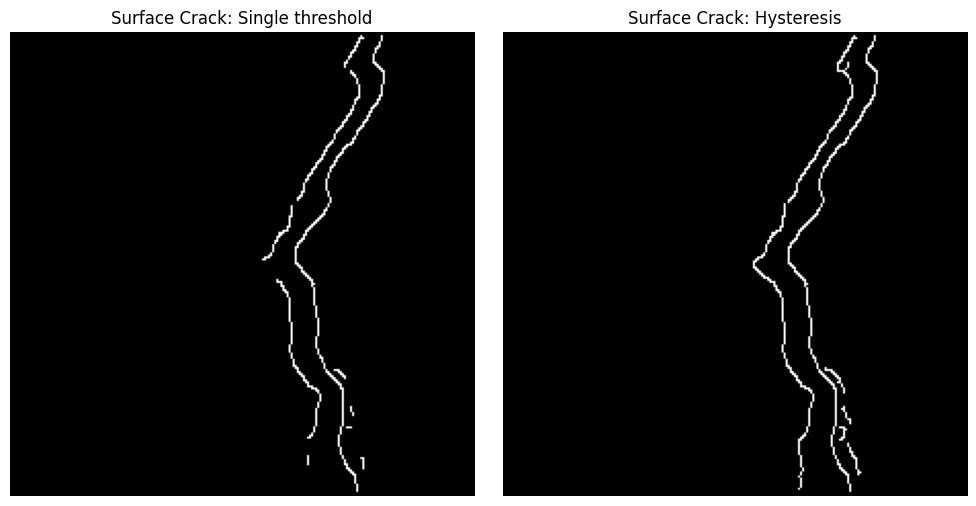

In [47]:
for name, nms in nms_results.items():
    t_low, t_high = compute_adaptive_thresholds(nms)
    edges_hysteresis = hysteresis_tracking(nms, t_low, t_high)
    edges_single = ((nms >= t_high) * 255).astype(np.uint8)

    print(f'{name}: Otsu Tlow={t_low:.2f}, Thigh={t_high:.2f}')
    print('  Edge pixels - single threshold:', np.sum(edges_single > 0))
    print('  Edge pixels - hysteresis      :', np.sum(edges_hysteresis > 0))

    show_image_grid(
        [edges_single, edges_hysteresis],
        [f'{name}: Single threshold', f'{name}: Hysteresis'],
        cols=2
    )

# Task 5: Scale-Space, Sensitivity & Failure Case Analysis

### Scale-Space Crack Merging

--- Surface Crack ---


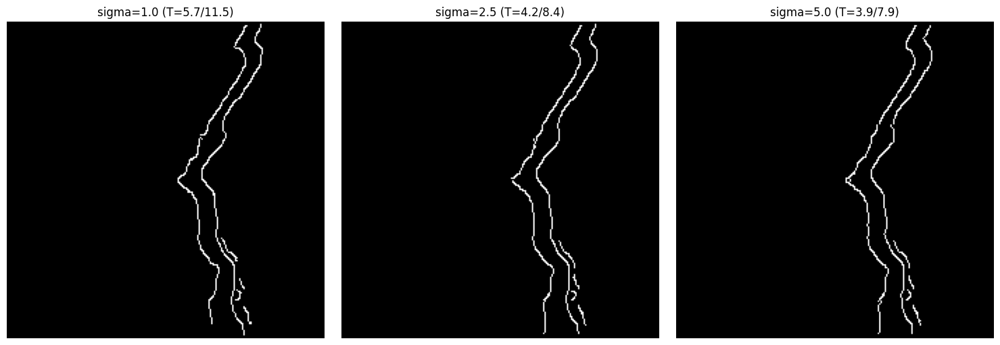

--- PCB ---


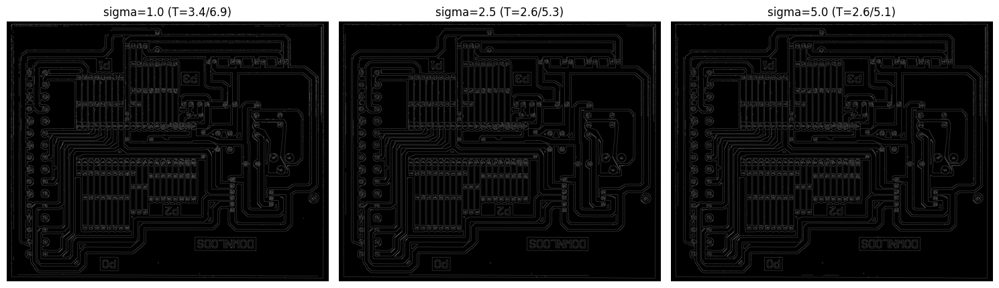

In [48]:
for name, img_path in [('Surface Crack', surface_test_paths[0]), ('PCB', pcb_test_paths[0])]:
    scale_image = load_image_grayscale(img_path)
    scale_images, scale_titles = [], []
    for sigma in [1.0, 2.5, 5.0]:
        edges, _, _, _, t_low, t_high = canny_edge_detection(scale_image, sigma=sigma)
        scale_images.append(edges)
        scale_titles.append(f'sigma={sigma} (T={t_low:.1f}/{t_high:.1f})')

    print(f'--- {name} ---')
    show_image_grid(scale_images, scale_titles, cols=3)

**Witkin's scale-space causality (for report):** increasing $\sigma$ smooths finer detail into coarser structure, so edges can only merge, weaken, or shift position as scale increases — the smoothing operation cannot inject new high-frequency structure, so no genuinely new edge can appear at a larger scale that was not already present at a finer one.

### Parameter Sensitivity Grid

--- PCB: Otsu-based sensitivity grid ---


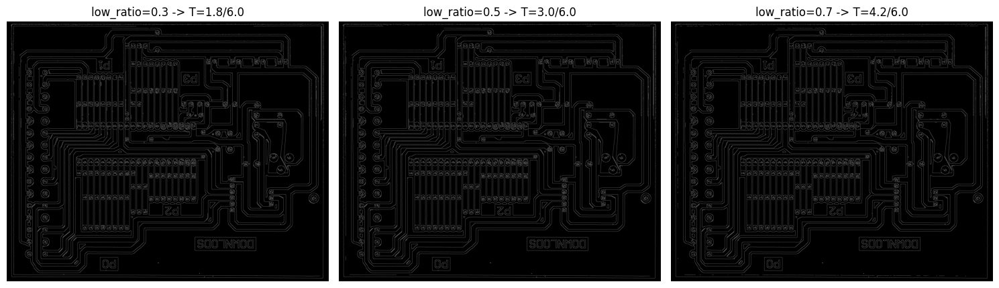

--- Surface Crack: Otsu-based sensitivity grid ---


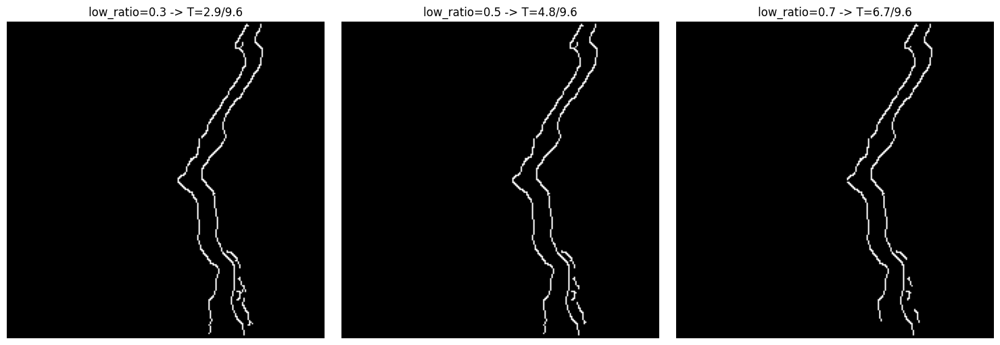

In [49]:
for name, img_path in [('PCB', pcb_test_paths[0]), ('Surface Crack', surface_test_paths[0])]:
    sens_image = load_image_grayscale(img_path)

    sens_images, sens_titles = [], []
    for ratio in [0.3, 0.5, 0.7]:
        edges, _, _, _, t_low, t_high = canny_edge_detection(sens_image, sigma=1.4, low_ratio=ratio)
        sens_images.append(edges)
        sens_titles.append(f'low_ratio={ratio} -> T={t_low:.1f}/{t_high:.1f}')

    print(f'--- {name}: Otsu-based sensitivity grid ---')
    show_image_grid(sens_images, sens_titles, cols=3)

### Failure Case Investigation

--- Surface Crack --- shadow T=8.8/17.5, texture T=1.9/4.7


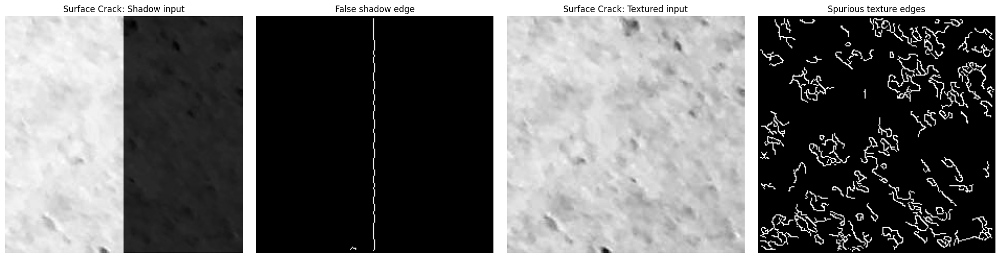

--- PCB --- shadow T=2.9/5.9, texture T=3.8/9.5


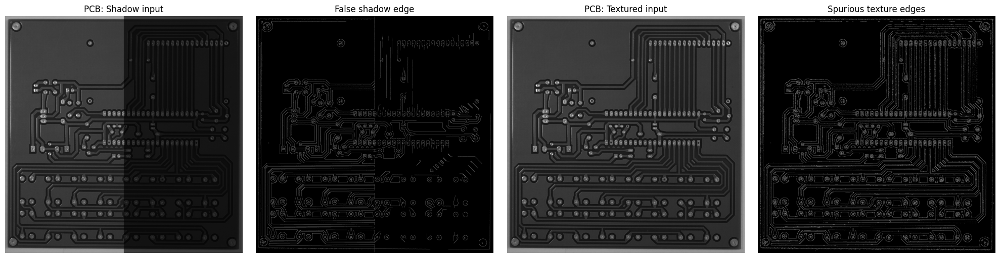

In [50]:
for name, img_path in [('Surface Crack', negative_image_paths[0]), ('PCB', pcb_test_paths[1])]:
    failure_image = load_image_grayscale(img_path).astype(np.float64)

    shadow_image = failure_image.copy()
    shadow_image[:, shadow_image.shape[1] // 2:] *= 0.4
    shadow_edges, _, _, _, sl, sh = canny_edge_detection(shadow_image, sigma=1.4)

    texture_edges, _, _, _, tl, th = canny_edge_detection(
        failure_image, sigma=0.5, low_ratio=0.4
    )

    print(f'--- {name} --- shadow T={sl:.1f}/{sh:.1f}, texture T={tl:.1f}/{th:.1f}')
    show_image_grid(
        [shadow_image.astype(np.uint8), shadow_edges, failure_image.astype(np.uint8), texture_edges],
        [f'{name}: Shadow input', 'False shadow edge', f'{name}: Textured input', 'Spurious texture edges'],
        cols=4
    )

**Failure case discussion (for report):**

1. **Shadow contours:** a sharp illumination boundary produces a large intensity gradient identical in form to a true material edge, so Canny reports a strong false edge along the shadow line even though no physical crack or defect exists there. Gradient-based edge detection cannot distinguish a reflectance change from an illumination change.

2. **Highly textured surfaces:** fine, high-frequency background texture (rough concrete/asphalt) generates many small local gradients that survive thresholding, flooding the output with spurious edges and making the real crack hard to isolate. Insufficient smoothing relative to the texture scale is the root cause — enlarging $\sigma$ helps but also blurs genuinely fine cracks, so the trade-off cannot be fully resolved with a single global threshold pair.

FOR OUTPUT IMAGES SAVING ONLY

In [ ]:
import os
OUT_DIR = '/content/drive/MyDrive/CV_Assignment1/output_images'
os.makedirs(OUT_DIR, exist_ok=True)

def save_image_grid(images, titles, filename, cols=3, cmap='gray'):
    rows = math.ceil(len(images) / cols)
    plt.figure(figsize=(5 * cols, 5 * rows))
    for idx in range(len(images)):
        plt.subplot(rows, cols, idx + 1)
        plt.imshow(images[idx], cmap=cmap)
        plt.title(titles[idx])
        plt.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(OUT_DIR, filename), dpi=200, bbox_inches='tight')
    plt.close()
    print('Saved:', filename)


# ---------------- Task 3 (Otsu-based thresholds) ----------------
for name, path in [('pcb', pcb_test_paths[0]), ('surface', surface_test_paths[0])]:
    img = load_image_grayscale(path)
    edges, mag, nms_, smoothed, tl, th = canny_edge_detection(img, sigma=1.4)
    save_image_grid([img, smoothed, normalize_uint8(mag), edges],
                     ['Original', 'Smoothed', 'Gradient magnitude', f'Edges (T={tl:.1f}/{th:.1f})'],
                     f'task3_canny_{name}.png', cols=4)

# ---------------- Task 4 (both datasets) ----------------
for name, path in [('pcb', pcb_test_paths[0]), ('surface', surface_test_paths[0])]:
    img4 = load_image_grayscale(path).astype(np.float64)
    imgs, titles = [], []
    for sn in [15, 35]:
        noisy = np.clip(img4 + np.random.normal(0, sn, img4.shape), 0, 255)
        m1, _ = sobel_gradients(noisy)
        sm = conv2d(noisy, g_k, padding='same')
        m2, _ = sobel_gradients(sm)
        imgs += [noisy, normalize_uint8(m1), normalize_uint8(m2)]
        titles += [f'Noisy sigma={sn}', 'Gradient (no smoothing)', 'Gradient (smoothed)']
    save_image_grid(imgs, titles, f'task4_ablation1_{name}.png', cols=3)

    sm4 = conv2d(img4, g_k, padding='same')
    mag4, dir4 = sobel_gradients(sm4)
    nms4 = non_max_suppression(mag4, dir4)
    save_image_grid([normalize_uint8(mag4), normalize_uint8(nms4)], ['Before NMS', 'After NMS'],
                     f'task4_ablation2_{name}.png', cols=2)

    t_low, t_high = compute_adaptive_thresholds(nms4)
    edges_h = hysteresis_tracking(nms4, t_low, t_high)
    edges_s = ((nms4 >= t_high) * 255).astype(np.uint8)
    save_image_grid([edges_s, edges_h], ['Single threshold', 'Hysteresis'],
                     f'task4_ablation3_{name}.png', cols=2)

# ---------------- Task 5 (both datasets) ----------------
for name, path in [('surface', surface_test_paths[0]), ('pcb', pcb_test_paths[0])]:
    img5 = load_image_grayscale(path)
    imgs, titles = [], []
    for sigma in [1.0, 2.5, 5.0]:
        e, _, _, _, tl, th = canny_edge_detection(img5, sigma=sigma)
        imgs.append(e); titles.append(f'sigma={sigma} (T={tl:.1f}/{th:.1f})')
    save_image_grid(imgs, titles, f'task5_scale_space_{name}.png', cols=3)

for name, path in [('pcb', pcb_test_paths[0]), ('surface', surface_test_paths[0])]:
    img5b = load_image_grayscale(path)
    imgs, titles = [], []
    for ratio in [0.3, 0.5, 0.7]:
        e, _, _, _, tl, th = canny_edge_detection(img5b, sigma=1.4, low_ratio=ratio)
        imgs.append(e); titles.append(f'ratio={ratio} T={tl:.1f}/{th:.1f}')
    save_image_grid(imgs, titles, f'task5_sensitivity_grid_{name}.png', cols=3)

for name, path in [('surface', negative_image_paths[0]), ('pcb', pcb_test_paths[1])]:
    fimg = load_image_grayscale(path).astype(np.float64)
    shadow = fimg.copy(); shadow[:, shadow.shape[1]//2:] *= 0.4
    shadow_edges, _, _, _, _, _ = canny_edge_detection(shadow, sigma=1.4)
    texture_edges, _, _, _, _, _ = canny_edge_detection(fimg, sigma=0.5, low_ratio=0.4)
    save_image_grid([shadow.astype(np.uint8), shadow_edges, fimg.astype(np.uint8), texture_edges],
                     ['Shadow input', 'False shadow edge', 'Textured input', 'Spurious texture edges'],
                     f'task5_failure_cases_{name}.png', cols=4)

print('\nAll figures saved to:', OUT_DIR)